In [9]:
import numpy as np
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
from tqdm import tqdm_notebook as tqdm

import scipy.special

import delfi.distribution as dd
import delfi.generator as dg
import delfi.inference as infer
import delfi.utils.io as io
import delfi.summarystats as ds

from lfimodels.glm.GLM import GLM
from lfimodels.glm.GLMStats import GLMStats
from delfi.utils.viz import plot_pdf

import lfimodels.glm.utils as utils

from io import BytesIO
import matplotlib.image as mpimg
import matplotlib.backends.backend_pdf

In [10]:
params = {'figure.titlesize': 'xx-large' }
pylab.rcParams.update(params)

In [24]:
seed = 42
prior_prec = 0.1

len_filter = 10
nrounds = 5

true_params, labels_params = utils.obs_params(len_filter=len_filter)
obs = utils.obs_data(true_params, seed=seed)
obs_stats = utils.obs_stats(true_params, seed=seed)

verbose = True

In [ ]:
rerun = False  # if False, will try loading file from disk

try:
    assert rerun == False, 'rerun requested'
    sam = np.load('glm_samples.npz')['arr_0']
except:
    sam = utils.pg_mcmc(true_params, obs)
    np.savez('glm_samples.npz', sam)

 74%|███████▎  | 367519/499999 [02:15<00:45, 2916.96it/s]

In [13]:
def sim_wrapper(convert_to_T):
    def sim(nrounds, N, alpha=0, seed=seed):
        m = GLM(len_filter=len_filter, seed=seed)
        p = utils.smoothing_prior(n_params=m.n_params, rel_prec=prior_prec, seed=seed)
        s = GLMStats(n_summary=m.n_params)
        g = dg.Default(model=m, prior=p, summary=s)

        res = infer.SNPE(g, 
                         obs=obs_stats, 
                         convert_to_T=convert_to_T,
                         n_hiddens=[10], 
                         seed=seed, 
                         pilot_samples=100,
                         svi=True,
                         reg_lambda=0.01,
                         prior_mixin=alpha,
                         prior_norm=False,
                         verbose=verbose)

        logs, tds, posteriors = res.run(n_train=N, 
                                        n_rounds=nrounds, 
                                        minibatch=100, 
                                        epochs=1000, 
                                        round_cl=3)

        return { 'true_params' : true_params, 'logs' : logs, 'tds' : tds, 'posteriors' : posteriors }
    
    return sim

In [14]:
# List of sample sizes to consider
Nlist = [ 100, 300, 1000, 3000, 10000 ]

# List of prior mixin values to consider
alphas = [ 0 , 0.001, 0.01, 0.1 ]

dists = { "Gaussian" : sim_wrapper(convert_to_T=None), \
          "Student's T (10 dof)" : sim_wrapper(convert_to_T=10), \
          "Student's T (3 dof)" : sim_wrapper(convert_to_T=3) }

sim_lists = {}

# Run simulations
for d in dists:
    sim_lists[d] = {}
    for alpha in alphas:
        sim_lists[d][alpha] = {}
        for n in tqdm(Nlist, desc="{}, alpha = {}".format(d,alpha)):
            sim_lists[d][alpha][n] = dists[d](nrounds, n, alpha=alpha)

In [20]:
def plot_run(d, alpha, n, posterior, true_params, out=None):
    temp = []
    for p in posteriors:
        fig, ax = plot_pdf(p.xs[0], lims=[-2,2], samples=sam, gt=true_params, figsize=(4,4))
        bio = BytesIO()
        fig_size = fig.get_size_inches()
        fig.savefig(bio, format='png', bbox_inches='tight', pad_inches=0)
        plt.close()
        bio.seek(0)
        temp.append(bio)

    fig_size[0] *= len(temp)
    fig_size[1] *= 1.25
    fig, axes = plt.subplots(1, len(temp),figsize=fig_size)
    
    fig.suptitle("{}, $\\alpha={}$, $N={}$".format(d,alpha, n))

    for i in range(len(temp)):
        t = temp[i]
        ax = axes[i]
        img = mpimg.imread(t, format='png')
        ax.set_frame_on(False)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
        ax.imshow(img, interpolation='bilinear')
        ax.set_title("Round {}".format(i + 1))

    fig.tight_layout(rect=[0,0.1, 1, 0.9])
    plt.show()
    
    if out is not None:
        out.savefig(fig)

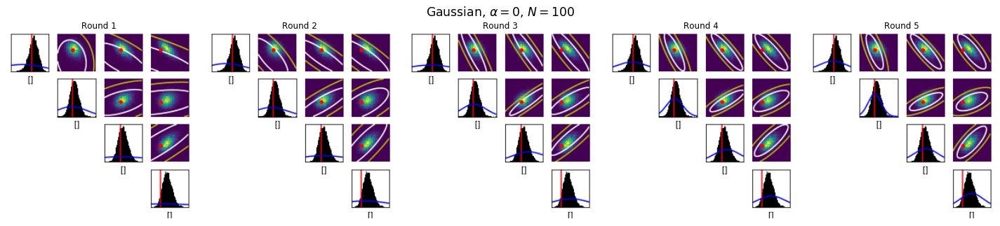

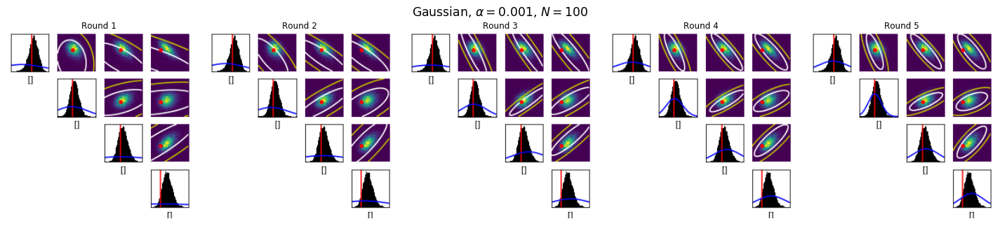

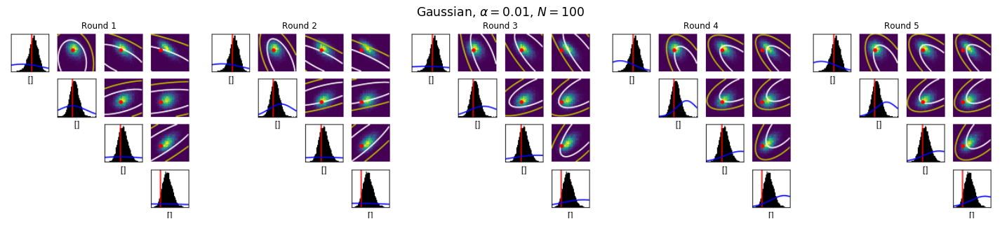

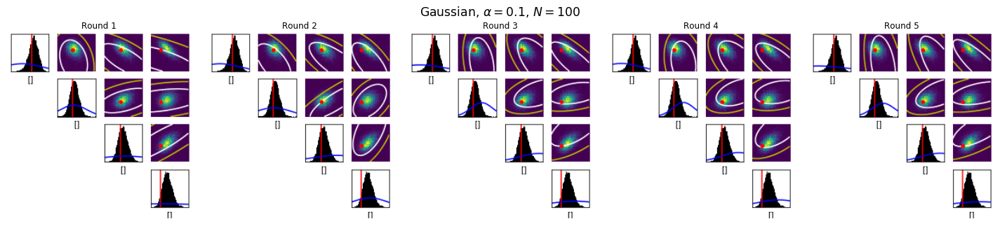

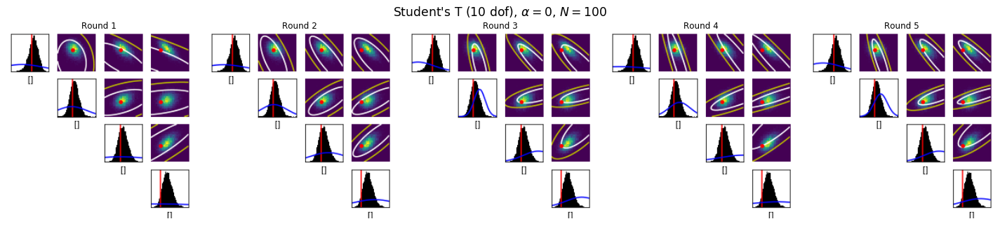

...

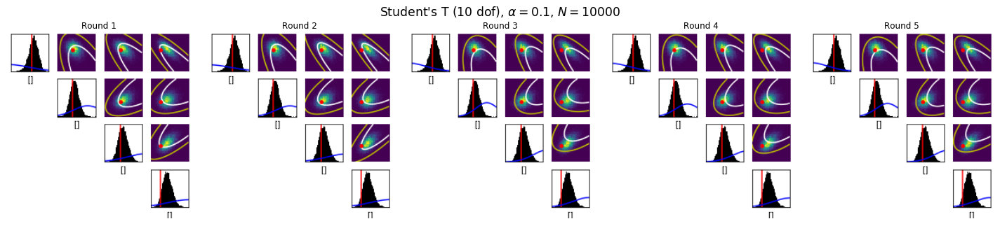

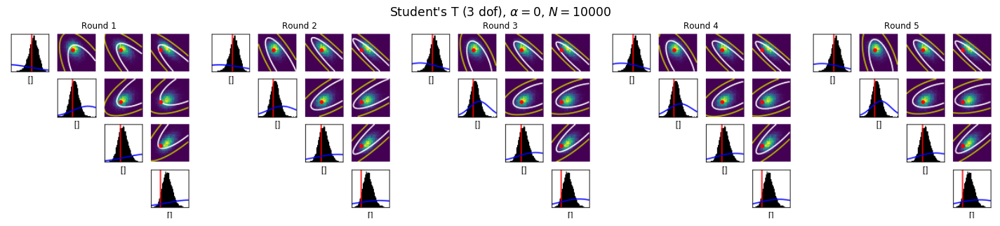

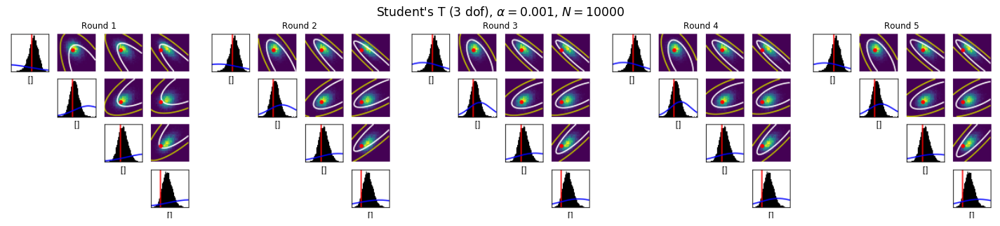

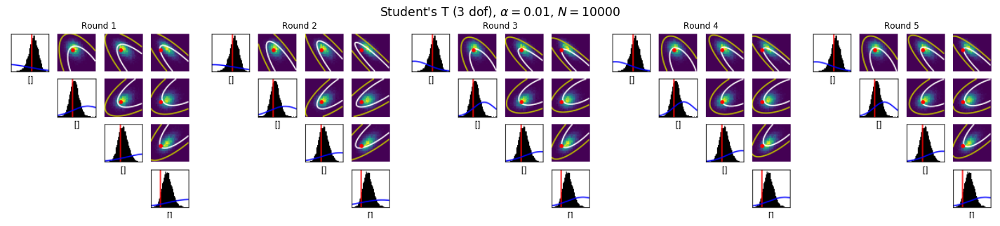

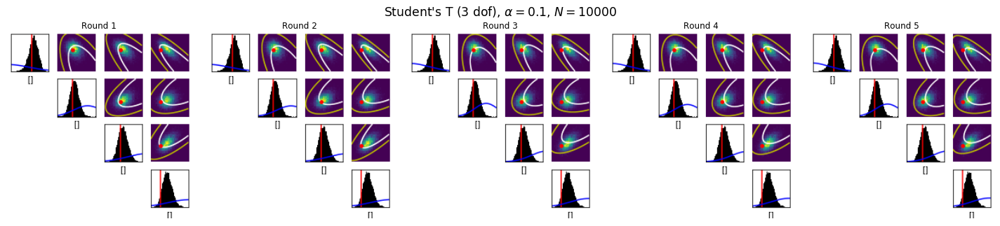

In [23]:
pdf = matplotlib.backends.backend_pdf.PdfPages("figs/glm_dim_{}_prior_prec_{}_seed_{}.pdf".format(len_filter, prior_prec, seed))

for n in Nlist:
    for d in dists:
        for alpha in alphas:
            posteriors = sim_lists[d][alpha][n]['posteriors']
            plot_run(d, alpha, n, posteriors, true_params, out=pdf)
            
pdf.close()